# 🧊 See Ice? Trends in Arctic Surface Air Temperature, Sea Temperature, and Ice Coverage in Relation to Global Warming

In this notebook, we will explore how the surface air temperature, sea temperature, and sea ice coverage in the Arctic region have progressed over the past decades. We will pull two data sources, one from the Copernicus Marine Service for the Arctic sea and ice surface temperature data, and the other from the National Snow and Ice Data Center for the surface air temperature data. By connecting and observing how each of these three atmospheric and cryospheric variables interconnect, we will provide a more nuanced understanding of how this vicious, positive feedback cycle is driving Arctic melting at an unprecedented rate. We will aim to address the following questions:

1. What role does surface air temperature play in the contribution of Arctic warming? Is there a significant trend in the melting of sea ice and the rise in air temperature?
2. To what extent are sea surface temperatures correlated with annual sea surface temperatures in the Arctic?
3. How has the sea ice extent coverage in the Arctic changed between 1981 and 2024?

### Background:

Arctic amplification, a phenomenon in which the Arctic warms faster than the rest of the planet, became a prominent and robust topic of discussion as early as the 1980s when satellite monitoring began. From 1979 to 2024, sea ice coverage has shrunk by 12.1 percent, which is equivalent to a loss of 30,000 square miles. For the remaining year-round ice, increasing temperatures have led to ice thinning, triggering a positive feedback loop where greater exposure to the ocean surface raises albedo and solar energy absorption, furthering the melting rate. Rapid warming surrounding this region poses many ecological, physical, social, and economic challenges such as sea-level rise, alteration in seasonal weather patterns, threats to Indigenous cultures, and habitat loss to Arctic species. As scientists race to improve climate model simulations to this never-ending growing temperature, understanding the precise physical and chemical variability in the atmosphere and ocean is crucial to updating how the Arctic region will evolve in the future. 
- **Source**: https://www.climate.gov/news-features/understanding-climate/climate-change-arctic-sea-ice-summer-minimum

In [2]:
import xarray as xr
import rioxarray
import earthaccess
import h5netcdf
from plotnine import *
import pandas as pd

## Arctic Surface Air Temperature 🌡️
- **Data Source:** https://nsidc.org/data/soac/near-surface-air-temperatures
- **Processing Source:** https://podaac.github.io/tutorials/external/access-cloud-python.html
  
This data is sourced by the National Snow and Ice Data Center and the NASA Modern-Era Retrospective Analysis for Research and Applications (MERRA) reanalysis project version 2. Surface air temperatures were measured 2 meters above the Earth’s surface and have been collected from multiple sources, including satellites, aircraft, balloon-borne instruments, and weather stations. This collection also consists of other meteorological variables, including air temperature at 2 meters, wind components, sea level pressure, surface pressure, and total precipitable water vapor.

### Processing and Opening Files

To process and open the Arctic MERRA-2 data, an account was set up on NASA EarthData to query NASA's metadata catalog and return a list of granule references. These granule references are files of satellite or Earth observation data, which are then opened using the earthaccess function to create a direct data stream from NASA's cloud storage into the Python environment. To process through every file of the 400+ files available, a for loop was used to sequentially ingest multiple independent data files, open them one at a time, and incrementally build a single, large optimized Zarr dataset. This dataset ultimately contains dates from 1981 to 2021 due to computational constraints that limit full processing of all the dates.

## ---------*DO NOT RUN THE CELLS BELOW!*---------

In [ ]:
earthaccess.login()

In [3]:
short_name = 'M2TMNXSLV'
version = '5.12.4'
start_time = '1981-12-31'
end_time = '2024-12-30'

granules = earthaccess.search_data(
    short_name = short_name,
    version = version,
    cloud_hosted = True,
    bounding_box = (-180, 60, 180, 90),
    temporal = (start_time, end_time),
)

In [ ]:
xarray_list = earthaccess.open(granules)

In [9]:
existing_times = set(
    np.asarray(ds_zarr.time.values).astype("datetime64[ns]")
)

In [ ]:
for i, file in enumerate(xarray_list, start=1):
    ds = xr.open_dataset(file, engine="h5netcdf")
    file_times = np.asarray(ds.time.values).astype("datetime64[ns]")

    ds.to_zarr(
        zarr_path,
        mode="a",
        append_dim="time"
    )

    # Update our in-memory record
    existing_times.update(file_times)
    ds.close()

### Exploratory Data Analysis

The pipeline in processing this dataset is supported by the NSIDC "Near-Surface Air Temperature" source, which provided guidance on how to emulate some of the already created maps that display surface-air temperature over the years. Following those steps, we first selected the atmospheric variables, "T2M" for surface air temperature at 2 meters in Kelvin, "TO3" for total ozone column in Dobsons, "TQI" for total precipitable ice water in kg m^2, "TQL" for total precipitable liquid water in kg m^2, and "TQV" for total precipitable water vapor in kg m^2. Next, we create a yearly average temperature by dropping any data points south of 60 degrees North and converting the T2M from Kelvin to Celsius. We dropped any duplicated times to ensure consistency within the data prior to grouping the data by the time means.

In accessing the full merra2.zarr files that contain all of the variables' folders on the GitHub end, we are unable to git push all of the multiple, independent, large files in the git folder within the time slot when we finished the project and the project's deadline. Instead, we have uploaded a CSV file of the cleaned dataframe that has been converted from an xarray and contains variables relevant to the visualizations discussed below ("surface_air_temp_clean_df.csv").

In [4]:
surface_air_temp_ds = xr.open_zarr('merra2.zarr')
surface_air_temp_ds

<xarray.Dataset> Size: 38GB
Dimensions:       (time: 480, lat: 361, lon: 576)
Coordinates:
  * lat           (lat) float64 3kB -90.0 -89.5 -89.0 -88.5 ... 89.0 89.5 90.0
  * lon           (lon) float64 5kB -180.0 -179.4 -178.8 ... 178.1 178.8 179.4
  * time          (time) datetime64[ns] 4kB 1981-12-01T00:30:00 ... 2021-11-0...
Data variables: (12/94)
    CLDPRS        (time, lat, lon) float32 399MB dask.array<chunksize=(1, 181, 288), meta=np.ndarray>
    CLDTMP        (time, lat, lon) float32 399MB dask.array<chunksize=(1, 181, 288), meta=np.ndarray>
    DISPH         (time, lat, lon) float32 399MB dask.array<chunksize=(1, 181, 288), meta=np.ndarray>
    H1000         (time, lat, lon) float32 399MB dask.array<chunksize=(1, 181, 288), meta=np.ndarray>
    H250          (time, lat, lon) float32 399MB dask.array<chunksize=(1, 181, 288), meta=np.ndarray>
    H500          (time, lat, lon) float32 399MB dask.array<chunksize=(1, 181, 288), meta=np.ndarray>
    ...            ...
    Var_V2M       (time, lat, lon) float32 399MB dask.array<chunksize=(1, 181, 288), meta=np.ndarray>
    Var_V500      (time, lat, lon) float32 399MB dask.array<chunksize=(1, 181, 288), meta=np.ndarray>
    Var_V50M      (time, lat, lon) float32 399MB dask.array<chunksize=(1, 181, 288), meta=np.ndarray>
    Var_V850      (time, lat, lon) float32 399MB dask.array<chunksize=(1, 181, 288), meta=np.ndarray>
    Var_ZLCL      (time, lat, lon) float32 399MB dask.array<chunksize=(1, 181, 288), meta=np.ndarray>
    ZLCL          (time, lat, lon) float32 399MB dask.array<chunksize=(1, 181, 288), meta=np.ndarray>
Attributes: (12/30)
    Comment:                           GMAO filename: d5124_m2_jan10.tavg1_2d...
    Contact:                           http://gmao.gsfc.nasa.gov
    Conventions:                       CF-1
    DataResolution:                    0.5 x 0.625
    EasternmostLongitude:              179.375
    Filename:                          MERRA2_400.tavgM_2d_slv_Nx.202111.nc4
    ...                                ...
    TemporalRange:                     1980-01-01 -> 2016-12-31
    Title:                             MERRA2 tavg1_2d_slv_Nx: 2d,1-Hourly,Ti...
    VersionID:                         5.12.4
    WesternmostLongitude:              -180.0
    identifier_product_doi:            10.5067/AP1B0BA5PD2K
    identifier_product_doi_authority:  http://dx.doi.org/

In [5]:
t2m = surface_air_temp_ds[['T2M', 'TO3', 'TQI', 'TQL', 'TQV']]

t2m_arctic = t2m.where(t2m.lat >= 60, drop = True)
t2m_arctic_c = t2m_arctic.assign(
    T2M = (t2m_arctic['T2M'] - 273.15).round(3)
)
t2m_arctic_c.attrs["units"] = "°C"

In [6]:
t2m_arctic_c = t2m_arctic_c.sortby("time")

t2m_arctic_c = t2m_arctic_c.isel(
    time=~t2m_arctic_c.time.to_index().duplicated()
)

In [7]:
t2m_yearly_climatology = (
    t2m_arctic_c.groupby("time.year").mean("time")
)

### Data Analysis

To visualize and plot trends of the atmospheric variables over the decades, we converted the xarray dataset into a dataframe. We introduced a new column, "Arctic Region" to label the different seas in the Arctic region based on the latitude and longitude coordinates. To address any uncertainty or anomaly in the dataset that may arise in the visualizations, we dropped 1981 to ensure consistency across trends with minimal outliers.

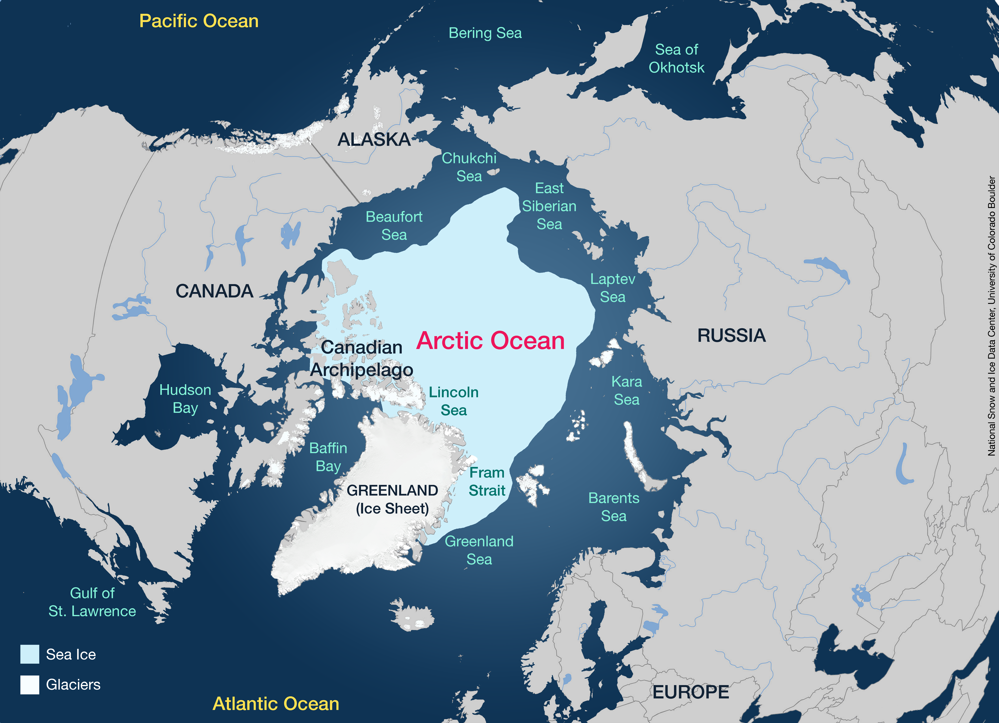

_**Figure 1:** This image is sourced from the National Snow and Ice Data Center, which points out the location of the Arctic seas and the relevance in understanding geographically how surface air temperature varies by continental and marine proximity._

In [8]:
df_clim_all = (t2m_yearly_climatology.to_dataframe().reset_index())

In [9]:
# Creating an extra row of the Arctic regions
def assign_arctic_region(lat, lon):
    if lat < 66:
        return 'Outside Arctic'
    if 66 <= lat <= 75 and -180 <= lon <= -150:
        return 'Chukchi Sea'
    if 70 <= lat <= 80 and -150 < lon <= -110:
        return 'Beaufort Sea'
    if 70 <= lat <= 80 and -110 < lon <= -60:
        return 'Canadian Archipelago'
    if 70 <= lat <= 82 and -60 < lon <= -20:
        return 'Greenland Sea'
    if 70 <= lat <= 80 and 20 <= lon <= 60:
        return 'Barents Sea'
    if 70 <= lat <= 80 and 60 < lon <= 100:
        return 'Kara Sea'
    if 70 <= lat <= 80 and 100 < lon <= 140:
        return 'Laptev Sea'
    if 66 <= lat <= 75 and 140 < lon <= 180:
        return 'East Siberian Sea'
    if lat > 80:
        return 'Central Arctic'
    return 'Other Arctic'

In [10]:
df_clim_all['Arctic Region'] = df_clim_all.apply(
    lambda r: assign_arctic_region(r['lat'], r['lon']),
    axis=1
)

df_year_clean = df_clim_all[df_clim_all["year"] > 1981]
df_year_clean.to_csv('surface_air_temp_clean_df.csv', index = False)
df_year_clean.head()

,year,lat,lon,T2M,TO3,TQI,TQL,TQV,Arctic Region
35136,1982,60.0,-180.000,2.461833,391.524658,0.025828,0.107425,10.099554,Outside Arctic
35137,1982,60.0,-179.375,2.454583,391.122955,0.025711,0.106800,10.116142,Outside Arctic
35138,1982,60.0,-178.750,2.433750,390.740082,0.025500,0.106069,10.132751,Outside Arctic
35139,1982,60.0,-178.125,2.384750,390.385010,0.025191,0.104957,10.155319,Outside Arctic
35140,1982,60.0,-177.500,2.329333,390.052887,0.024779,0.103805,10.176280,Outside Arctic


## ---------*ONLY RUN CELLS BELOW THIS LINE!*---------

In [4]:
df_year_clean_1 = pd.read_csv('surface_air_temp_clean_df_half1.csv')
df_year_clean_2 = pd.read_csv('surface_air_temp_clean_df_half2.csv')
df_year_clean = pd.concat([df_year_clean_1, df_year_clean_2])
df_year_clean.head()

,year,lat,lon,T2M,TO3,TQI,TQL,TQV,Arctic Region
0,1982,60.0,-180.000,2.461833,391.52466,0.025828,0.107425,10.099554,Outside Arctic
1,1982,60.0,-179.375,2.454583,391.12296,0.025711,0.106800,10.116142,Outside Arctic
2,1982,60.0,-178.750,2.433750,390.74008,0.025500,0.106069,10.132751,Outside Arctic
3,1982,60.0,-178.125,2.384750,390.38500,0.025191,0.104957,10.155319,Outside Arctic
4,1982,60.0,-177.500,2.329333,390.05290,0.024779,0.103805,10.176280,Outside Arctic


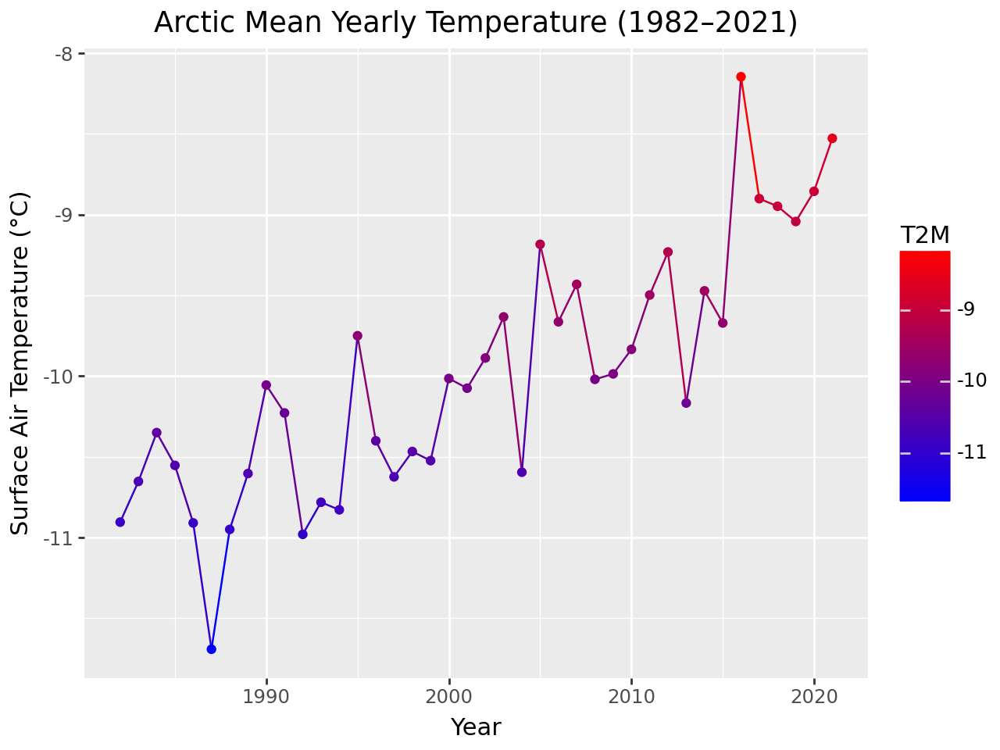

In [5]:
df_year = (df_year_clean.groupby('year')['T2M'].mean().reset_index())

(
    ggplot(df_year, aes(x="year", y="T2M", color="T2M"))
    + geom_line()
    + geom_point()
    + labs(
        title="Arctic Mean Yearly Temperature (1982–2021)",
        x="Year",
        y="Surface Air Temperature (°C)"
    )
    + scale_color_gradient(low='blue', high='red')
)

_**Figure 2**: There is an evident positive trend in warming surface air temperature from 1982 to 2021, with the year 2016 reaching the warmest temperature of near -8.2 degrees C. In a NOAA-sponsored report, unprecedented warming air temperature in 2016 broke record as the highest in temperature. The Arctic sea ice from mid-October 2016 to late November 2016 was the lowest as well, suggesting that abnormal weather changes may have triggered this rapid warming. Arctic surface air temperature serves as an important indicator of atmospheric, cryospheric, and oceanic variability by modulating extreme heat/cold changes, evaporation, and atmospheric pressure._

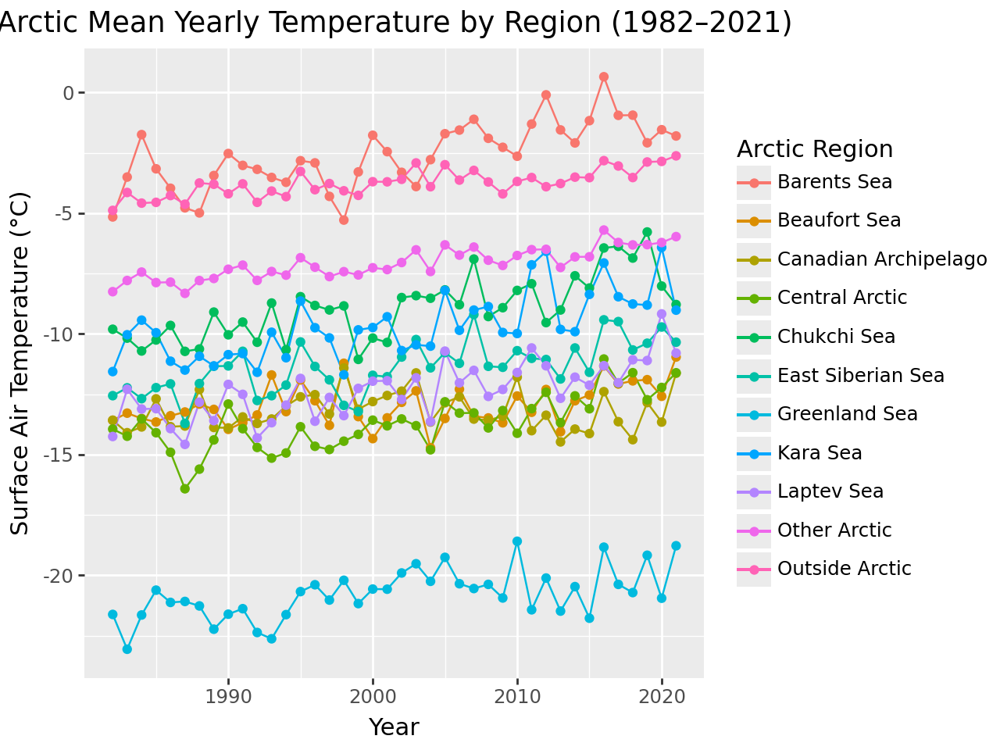

In [6]:
df_region_year = (df_year_clean.groupby(['Arctic Region', 'year'])['T2M'].mean().reset_index())

(
    ggplot(df_region_year, aes(x="year", y="T2M", group='Arctic Region', color = 'Arctic Region'))
    + geom_line()
    + geom_point()
    + labs(
        title="Arctic Mean Yearly Temperature by Region (1982–2021)",
        x="Year",
        y="Surface Air Temperature (°C)"
    )
)

_**Figure 3**: This visual displays the nine main seas surrounding the Arctic region and the change of surface air temperature over the years from 1982 to 2021. The Barents Sea, in particular, is the warmest Arctic region, with surface air temperature increasing by over 3 degrees C since 1982. The water temperature of the Barents Sea is dependent on the warm Atlantic water that flows up north, which results in "Atlantification", a term used to describe the sea's shift from a cold, ice-covered Arctic state to a warmer, Atlantic-dominated regime. We also see the Chukchi Sea and Kara Sea, subsequently the next two seas with the warmest surface air temperature. Warming in these regions may primarily be due to the influx of warmer Atlantic and Pacific Ocean waters that increase the atmospheric heat and reduce sea ice cover. Lastly, we see the Greenland Sea with the lowest surface air temperature, with a relatively stagnant trend of its temperature in the -20 degrees C range. The sea's location within the Arctic Circle receives cold Arctic air masses, which results in less intense solar heating and persistent strong northerly winds that bring cold air into the region._

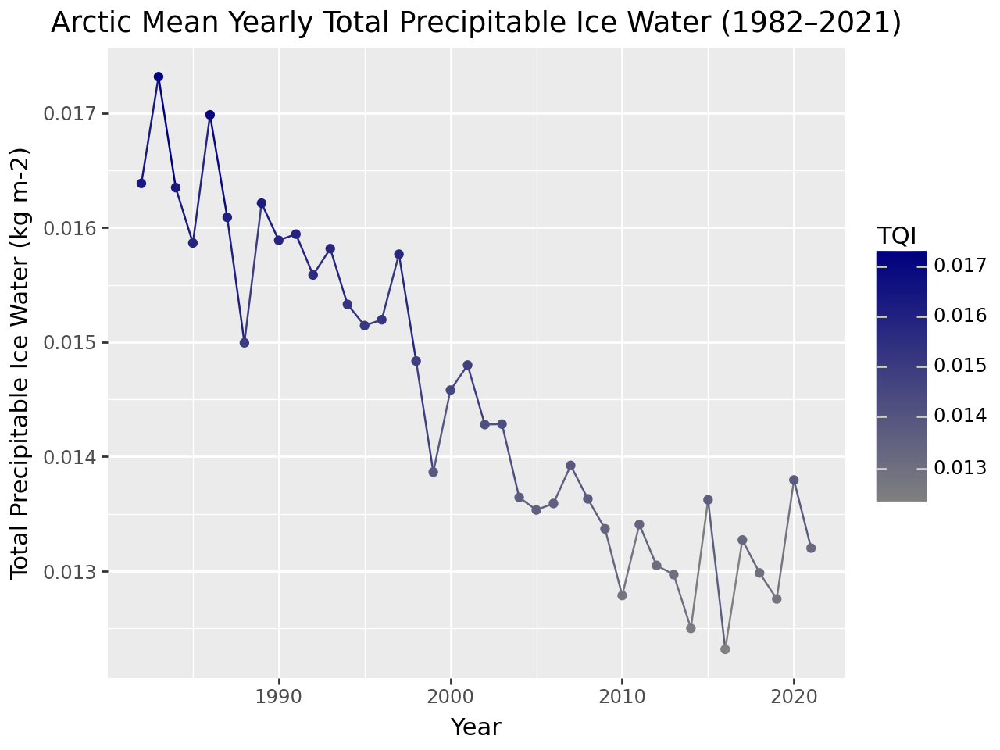

In [7]:
df_year_TQI = (df_year_clean.groupby('year')['TQI'].mean().reset_index())

(
    ggplot(df_year_TQI, aes(x="year", y="TQI", color="TQI"))
    + geom_line()
    + geom_point()
    + labs(
        title="Arctic Mean Yearly Total Precipitable Ice Water (1982–2021)",
        x="Year",
        y="Total Precipitable Ice Water (kg m-2)"
    )
    + scale_color_gradient(low='gray', high='navy')
)


_**Figure 4**: Total precipitable ice water is the total mass of water in ice form in a vertical column from the surface to the top of the atmosphere. As the decades progress, there is an alarming decrease in total precipitable ice water, with a decline from 0.016-0.017 kg m-2 to as low as 0.013 kg m-2. This decline correlates with the Arctic's more dramatic shifts of rapid sea ice decline, increased atmospheric moisture, and more extreme precipitation events. As sea ice melts, warmer and wetter air results in rain conditions rather than snowfall. According to the Woodwell Climate, Arctic sea-ice retreat contributes to heavier evaporation, and thus greater precipitation and moisture containment._

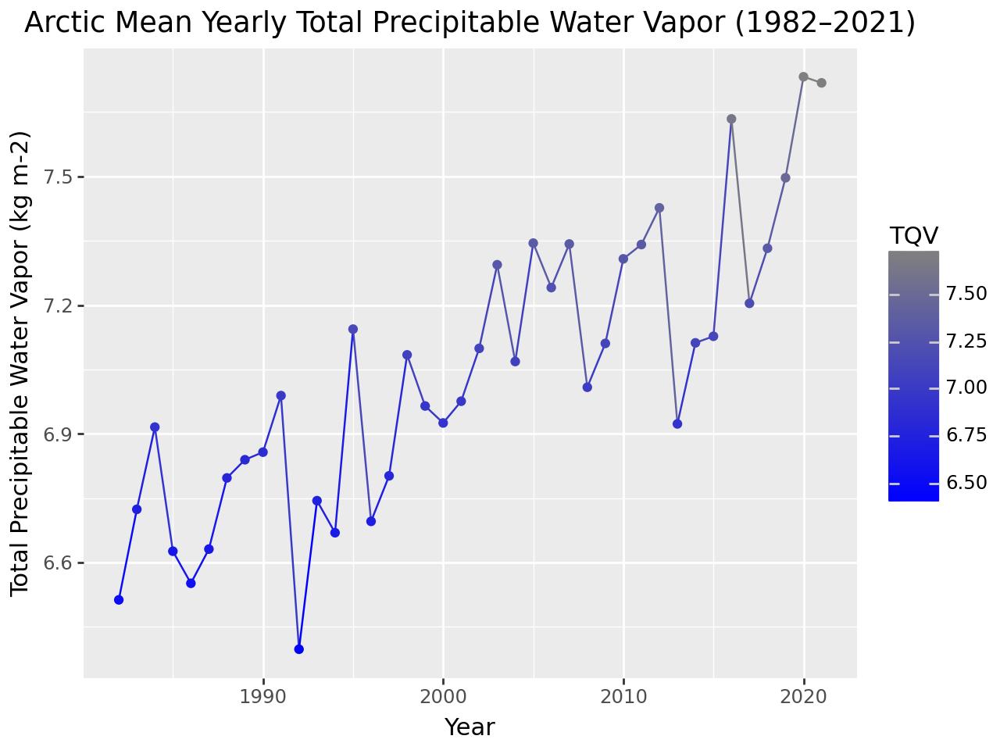

In [8]:
df_year_TQV = (df_year_clean.groupby('year')['TQV'].mean().reset_index())

(
    ggplot(df_year_TQV, aes(x="year", y="TQV", color="TQV"))
    + geom_line()
    + geom_point()
    + labs(
        title="Arctic Mean Yearly Total Precipitable Water Vapor (1982–2021)",
        x="Year",
        y="Total Precipitable Water Vapor (kg m-2)"
    )
    + scale_color_gradient(low='blue', high='grey')
)

_**Figure 5**: The Arctic mean yearly total precipitable water vapor shares a similar trend with total surface air temperature, where as the years progress, water vapor density increases from as low as 6.3 kg m-2 to over 7.5 kg m-2 in just a few decades. We also see an inverse relationship with the total precipitable ice water, where a decline in snow precipitation is the result of an increase in warmer water sources in the vertical column of the atmosphere. The amount of water vapor is dependent on the surface air temperature by acting as a potent greenhouse gas and energy transporter. Greater water vapor contains more heat, driving warmer, moist air in the Arctic regions. This positive feedback loop fuels storms and causes rain-on-snow events, which reduces sea ice and green vegetation._

This concludes the analysis of surface air temperature in Arctic regions, which is one of the three variabilities addressed regarding Arctic warming. To address the two other questions regarding sea surface temperature and sea ice concentration, please navigate to the **"sea_ice_analysed" notebook** for further analysis and discussion.